In [1]:
import torch
import torch.nn as nn
from thop import profile
import os
from pathlib import Path
import pandas as pd
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from einops import repeat
from transformers.optimization import (
    get_linear_schedule_with_warmup,
    get_cosine_schedule_with_warmup,
)
from fastprogress.fastprogress import master_bar, progress_bar
from fastai.vision.all import L, unsqueeze
from timm.data.mixup import Mixup
from timm.loss import (
    LabelSmoothingCrossEntropy,
    BinaryCrossEntropy,
    SoftTargetCrossEntropy,
)

from einops import rearrange

#https://github.com/FanChiMao/SRMNet/blob/main/SRMNet.py
##---------- Basic Layers ----------
def conv3x3(in_chn, out_chn, bias=True):
    layer = nn.Conv2d(in_chn, out_chn, kernel_size=3, stride=1, padding=1, bias=bias)
    return layer


def conv(in_channels, out_channels, kernel_size, bias=False, stride=1):
    return nn.Conv2d(
        in_channels,
        out_channels,
        kernel_size,
        padding=(kernel_size // 2),
        bias=bias,
        stride=stride,
    )


def bili_resize(factor):
    return nn.Upsample(scale_factor=factor, mode="bilinear", align_corners=False)


##---------- Basic Blocks ----------
class UNetConvBlock(nn.Module):
    def __init__(self, in_size, out_size, downsample):
        super(UNetConvBlock, self).__init__()
        self.downsample = downsample
        self.block = SK_RDB(in_channels=in_size, growth_rate=out_size, num_layers=3)
        if downsample:
            self.downsample = PS_down(out_size, out_size, downscale=2)

    def forward(self, x):
        out = self.block(x)
        if self.downsample:
            out_down = self.downsample(out)
            return out_down, out
        else:
            return out


class UNetUpBlock(nn.Module):
    def __init__(self, in_size, out_size):
        super(UNetUpBlock, self).__init__()
        # self.up = nn.ConvTranspose2d(in_size, out_size, kernel_size=2, stride=2, bias=True)
        self.up = PS_up(in_size, out_size, upscale=2)
        self.conv_block = UNetConvBlock(in_size, out_size, False)

    def forward(self, x, bridge):
        up = self.up(x)
        out = torch.cat([up, bridge], dim=1)
        out = self.conv_block(out)
        return out


##---------- Resizing Modules (Pixel(Un)Shuffle) ----------
class PS_down(nn.Module):
    def __init__(self, in_size, out_size, downscale):
        super(PS_down, self).__init__()
        self.UnPS = nn.PixelUnshuffle(downscale)
        self.conv1 = nn.Conv2d((downscale**2) * in_size, out_size, 1, 1, 0)

    def forward(self, x):
        x = self.UnPS(x)  # h/2, w/2, 4*c
        x = self.conv1(x)
        return x


class PS_up(nn.Module):
    def __init__(self, in_size, out_size, upscale):
        super(PS_up, self).__init__()

        self.PS = nn.PixelShuffle(upscale)
        self.conv1 = nn.Conv2d(in_size // (upscale**2), out_size, 1, 1, 0)

    def forward(self, x):
        x = self.PS(x)  # h/2, w/2, 4*c
        x = self.conv1(x)
        return x


##---------- Selective Kernel Feature Fusion (SKFF) ----------
class SKFF(nn.Module):
    def __init__(self, in_channels, height=3, reduction=8, bias=False):
        super(SKFF, self).__init__()

        self.height = height
        d = max(int(in_channels / reduction), 4)

        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv_du = nn.Sequential(
            nn.Conv2d(in_channels, d, 1, padding=0, bias=bias), nn.PReLU()
        )

        self.fcs = nn.ModuleList([])
        for i in range(self.height):
            self.fcs.append(
                nn.Conv2d(d, in_channels, kernel_size=1, stride=1, bias=bias)
            )

        self.softmax = nn.Softmax(dim=1)

    def forward(self, inp_feats):
        batch_size, n_feats, H, W = inp_feats[1].shape

        inp_feats = torch.cat(inp_feats, dim=1)
        inp_feats = inp_feats.view(
            batch_size, self.height, n_feats, inp_feats.shape[2], inp_feats.shape[3]
        )

        feats_U = torch.sum(inp_feats, dim=1)
        feats_S = self.avg_pool(feats_U)
        feats_Z = self.conv_du(feats_S)

        attention_vectors = [fc(feats_Z) for fc in self.fcs]
        attention_vectors = torch.cat(attention_vectors, dim=1)
        attention_vectors = attention_vectors.view(
            batch_size, self.height, n_feats, 1, 1
        )

        attention_vectors = self.softmax(attention_vectors)
        feats_V = torch.sum(inp_feats * attention_vectors, dim=1)

        return feats_V


##---------- Dense Block ----------
class DenseLayer(nn.Module):
    def __init__(self, in_channels, out_channels, I):
        super(DenseLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=3 // 2)
        self.relu = nn.ReLU(inplace=True)
        self.sk = SKFF(out_channels, height=2, reduction=8, bias=False)

    def forward(self, x):
        x1 = self.relu(self.conv(x))
        # output = torch.cat([x, x1], 1) # -> RDB
        output = self.sk((x, x1))
        return output


##---------- Selective Kernel Residual Dense Block (SK-RDB) ----------
class SK_RDB(nn.Module):
    def __init__(self, in_channels, growth_rate, num_layers):
        super(SK_RDB, self).__init__()
        self.identity = nn.Conv2d(in_channels, growth_rate, 1, 1, 0)
        self.layers = nn.Sequential(
            *[DenseLayer(in_channels, in_channels, I=i) for i in range(num_layers)]
        )
        self.lff = nn.Conv2d(in_channels, growth_rate, kernel_size=1)

    def forward(self, x):
        res = self.identity(x)
        x = self.layers(x)
        x = self.lff(x)
        return res + x


##---------- testNet ----------
class SRMNet(nn.Module):
    def __init__(self, in_chn=3, wf=96, depth=4):
        super(SRMNet, self).__init__()
        self.depth = depth
        self.down_path = nn.ModuleList()
        self.bili_down = bili_resize(0.5)
        self.conv_01 = nn.Conv2d(in_chn, wf, 3, 1, 1)

        # encoder of UNet
        prev_channels = 0
        for i in range(depth):  # 0,1,2,3
            downsample = True if (i + 1) < depth else False
            self.down_path.append(
                UNetConvBlock(prev_channels + wf, (2**i) * wf, downsample)
            )
            prev_channels = (2**i) * wf

        # decoder of UNet
        self.up_path = nn.ModuleList()
        self.skip_conv = nn.ModuleList()
        self.conv_up = nn.ModuleList()
        self.bottom_conv = nn.Conv2d(prev_channels, wf, 3, 1, 1)
        self.bottom_up = bili_resize(2 ** (depth - 1))

        for i in reversed(range(depth - 1)):
            self.up_path.append(UNetUpBlock(prev_channels, (2**i) * wf))
            self.skip_conv.append(nn.Conv2d((2**i) * wf, (2**i) * wf, 3, 1, 1))
            self.conv_up.append(
                nn.Sequential(
                    *[nn.Conv2d((2**i) * wf, wf, 3, 1, 1), bili_resize(2**i)]
                )
            )
            prev_channels = (2**i) * wf

        self.final_ff = SKFF(in_channels=wf, height=depth)
        self.last = conv3x3(prev_channels, in_chn, bias=True)

    def forward(self, x):
        img = x
        scale_img = img

        ##### shallow conv #####
        x1 = self.conv_01(img)
        encs = []
        ######## UNet ########
        # Down-path (Encoder)
        for i, down in enumerate(self.down_path):
            if i == 0:
                x1, x1_up = down(x1)
                encs.append(x1_up)
            elif (i + 1) < self.depth:
                scale_img = self.bili_down(scale_img)
                left_bar = self.conv_01(scale_img)
                x1 = torch.cat([x1, left_bar], dim=1)
                x1, x1_up = down(x1)
                encs.append(x1_up)
            else:
                scale_img = self.bili_down(scale_img)
                left_bar = self.conv_01(scale_img)
                x1 = torch.cat([x1, left_bar], dim=1)
                x1 = down(x1)

        # Up-path (Decoder)
        ms_result = [self.bottom_up(self.bottom_conv(x1))]
        for i, up in enumerate(self.up_path):
            x1 = up(x1, self.skip_conv[i](encs[-i - 1]))
            ms_result.append(self.conv_up[i](x1))
        # Multi-scale selective feature fusion
        msff_result = self.final_ff(ms_result)

        ##### Reconstruct #####
        out_1 = self.last(msff_result) + img

        return out_1

In [2]:
#NORMALIZATIOn
def normalize(x, pmin=3, pmax=97, axis=None, clip=False, eps=1e-20, dtype=np.float32):
    """Percentile-based image normalization."""

    mi = np.percentile(x,pmin,axis=axis,keepdims=True)
    ma = np.percentile(x,pmax,axis=axis,keepdims=True)
    return normalize_mi_ma(x, mi, ma, clip=clip, eps=eps, dtype=dtype)


def normalize_mi_ma(x, mi, ma, clip=False, eps=1e-20, dtype=np.float32):
    if dtype is not None:
        x   = x.astype(dtype,copy=False)
        mi  = dtype(mi) if np.isscalar(mi) else mi.astype(dtype,copy=False)
        ma  = dtype(ma) if np.isscalar(ma) else ma.astype(dtype,copy=False)
        eps = dtype(eps)

    try:
        import numexpr
        x = numexpr.evaluate("(x - mi) / ( ma - mi + eps )")
    except ImportError:
        x =                   (x - mi) / ( ma - mi + eps )

    if clip:
        x = np.clip(x,0,1)

    return x


In [3]:
# TRAINING PIPELINE


class SaveModel:
    def __init__(self, folder, exp_name, best=np.inf):
        self.best = best
        self.folder = Path(folder) / f"{exp_name}.pth"

    def __call__(self, score, model, epoch):
        if score < self.best:
            self.best = score
            print(f"Better model found at epoch {epoch} with value: {self.best}.")
            torch.save(model.state_dict(), self.folder)


class SaveModelMetric:
    def __init__(self, folder, exp_name, best=-np.inf):
        self.best = best
        self.folder = Path(folder) / f"{exp_name}.pth"

    def __call__(self, score, model, epoch):
        if score > self.best:
            self.best = score
            print(f"Better model found at epoch {epoch} with value: {self.best}.")
            torch.save(model.state_dict(), self.folder)


class SaveModelEpoch:
    def __init__(self, folder, exp_name, best=-np.inf):
        self.best = best
        self.folder = Path(folder)
        self.exp_name = exp_name

    def __call__(self, score, model, epoch):
        self.best = score
        print(f"Better model found at epoch {epoch} with value: {self.best}.")
        torch.save(model.state_dict(), f"{self.folder/self.exp_name}_{epoch}.pth")


def custom_auc_score(p, gt):
    return roc_auc_score(gt.cpu().numpy(), F.softmax(p).cpu().numpy()[:, 1])


def fit_mixup(
    epochs,
    model,
    train_dl,
    valid_dl,
    loss_fn,
    opt,
    folder="models",
    exp_name="exp_00",
    device=None,
    sched=None,
    save_md=SaveModelEpoch,
):
    if device is None:
        device = (
            torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
        )

    os.makedirs(folder, exist_ok=True)
    loss_fn_trn = loss_fn
    mb = master_bar(range(epochs))
    mb.write(["epoch", 
              "train_loss",
              "valid_loss"], table=True)
    model.to(device)  # we have to put our model on gpu
    scaler = torch.cuda.amp.GradScaler()  # this for half precision training
    save_md = save_md(folder, exp_name)

    for i in mb:  # iterating  epoch
        trn_loss, val_loss = 0.0, 0.0
        trn_n, val_n = len(train_dl.dataset), len(valid_dl.dataset)
        model.train()  # set model for training
        for (xb, yb, msk) in progress_bar(train_dl, parent=mb):
            #lbl, input, mask
            xb, yb, msk, = xb.to(device), yb.to(device), msk.to(device)  # putting batches to device
            with torch.cuda.amp.autocast():  # half precision
                out = model(yb)  # forward pass
                loss = loss_fn_trn(out, msk, xb)  # calulation loss
            trn_loss += loss.item()

            scaler.scale(loss).backward()  # backward
            scaler.step(opt)  # optimzers step
            scaler.update()  # for half precision
            opt.zero_grad()  # zeroing optimizer
            if sched is not None:
                sched.step()  # scuedular step

        trn_loss /= mb.child.total

        # putting model in eval mode
        model.eval()
        # after epooch is done we can run a validation dataloder and see how are doing
        with torch.no_grad():
            for (xb, yb, msk) in progress_bar(valid_dl, parent=mb):
                xb, yb, msk, = xb.to(device), yb.to(device), msk.to(device)
                out = model(yb)
                loss = loss_fn(out, msk, xb)
                val_loss += loss.item()
        # calculating metric
        # saving model if necessary
        val_loss /= mb.child.total
        save_md(val_loss, model, i)


        pd.DataFrame(
            {
                "trn_loss": [trn_loss],
                "val_loss": [val_loss],
            }
        ).to_csv(f"{folder}/{exp_name}_{i}.csv", index=False)
        mb.write(
            [
                i,
                f"{trn_loss:.6f}",
                f"{val_loss:.6f}",
            ],
            table=True,
        )
    print("Training done")
    # loading the best checkpoint

In [4]:
#VOID TO NOISE PAPER SET UP
import copy
import h5py



def get_mask(input):
    ratio = 0.9
    size_window = (5, 5)
    size_data = input.shape
    num_sample = int(size_data[0] * size_data[1] * (1 - ratio))
    mask = np.ones(size_data)
    output = input
    for ich in range(size_data[2]):
        idy_msk = np.random.randint(0, size_data[0], num_sample)
        idx_msk = np.random.randint(0, size_data[1], num_sample)

        idy_neigh = np.random.randint(
            -size_window[0] // 2 + size_window[0] % 2,
            size_window[0] // 2 + size_window[0] % 2,
            num_sample,
        )
        idx_neigh = np.random.randint(
            -size_window[1] // 2 + size_window[1] % 2,
            size_window[1] // 2 + size_window[1] % 2,
            num_sample,
        )

        idy_msk_neigh = idy_msk + idy_neigh
        idx_msk_neigh = idx_msk + idx_neigh

        idy_msk_neigh = (
            idy_msk_neigh
            + (idy_msk_neigh < 0) * size_data[0]
            - (idy_msk_neigh >= size_data[0]) * size_data[0]
        )
        idx_msk_neigh = (
            idx_msk_neigh
            + (idx_msk_neigh < 0) * size_data[1]
            - (idx_msk_neigh >= size_data[1]) * size_data[1]
        )

        id_msk = (idy_msk, idx_msk, ich)
        id_msk_neigh = (idy_msk_neigh, idx_msk_neigh, ich)

        output[id_msk] = input[id_msk_neigh]
        mask[id_msk] = 0.0

    return output, mask


class DataV0:
    """
    dataset = Dataset(data_type, df)

    img, y = dataset[i]
      img (np.float32): 2 x 360 x 128
      y (np.float32): label 0 or 1
    """

    def __init__(self, df, tfms=False):
        self.df = df
        self.tfms = tfms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        """
        i (int): get ith data
        """
        r = self.df.iloc[i]
        y = np.float32(r.target)
        filename=r.id
        file_id = Path(r.id).stem
        img = np.empty((2, 360, 128), dtype=np.float32)

        with h5py.File(filename, 'r') as f:
            g = f[file_id]

            for ch, s in enumerate(['H1', 'L1']):
                a = g[s]['SFTs'][:, :4096] * 1e22  # Fourier coefficient complex64
                p = a.real**2 + a.imag**2  # power
                p = np.mean(p.reshape(360, 128, 32), axis=2)  # compress 4096 -> 128
                img[ch] = normalize(p, clip=True)

        if self.tfms:
            if np.random.rand() <= 0.5:  # horizontal flip
                img = np.flip(img, axis=1).copy()
            if np.random.rand() <= 0.5:  # vertical flip
                img = np.flip(img, axis=2).copy()
            if np.random.rand() <= 0.5:  # vertical shift
                img = np.roll(img, np.random.randint(low=0, high=img.shape[1]), axis=1)

        label = rearrange(img, "c h w -> h w c")
        input, mask = get_mask(copy.deepcopy(label))
        return rearrange(label, "h w c -> c h w"), rearrange(input, "h w c -> c h w"),  rearrange(mask, "h w c -> c h w")


def customplot(x, y, k=None):
    if k:
        plt.imshow(torch.concat([x.mean(0), y.mean(0), k.mean(0)], 1))
    else:
        plt.imshow(torch.concat([x.mean(0), y.mean(0)], 1))

In [5]:
class CFG:
    bs = 32
    nw = 4
    model_name = "NOISE_TO_VOID"
    lr = 1e-4
    wd = 1e-4
    epoch = 100
    warmup_pct = 0.01
    num_classes = 2
    dropout_rate = 0.3
    folder = "NOISE_TO_VOID_TRN"
    exp_name = f"{folder}_{model_name}"

In [6]:
#submit = pd.read_csv('../data/sample_submission.csv')
#submit.columns = ['fn', 'target']
#submit['fn'] = submit['fn'].apply(lambda x: Path('../data/test')/f'{x}.hdf5')
#submit.columns = ['id', 'target']

In [7]:
trn_df = pd.read_csv('../data/SPLITS/V_20/trn_df.csv')
trn_df = trn_df.query('snr>40').reset_index(drop=True)

vld_df = pd.read_csv('../data/SPLITS/V_20/val_df.csv')
vld_df = trn_df.query('snr>40').reset_index(drop=True)

In [8]:
data_df = pd.concat([trn_df, vld_df], ignore_index=True).sample(frac=1).reset_index(drop=True)
data_df.shape

(12476, 13)

In [9]:
trn_ds = DataV0(data_df, True)
vld_ds = DataV0(data_df[:100])
len(trn_ds), len(vld_ds)

(12476, 100)

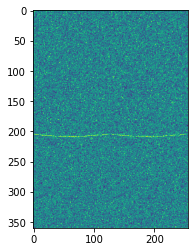

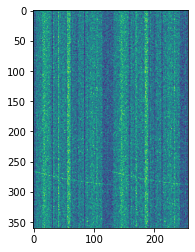

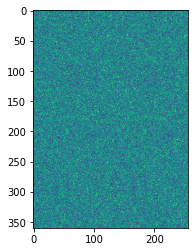

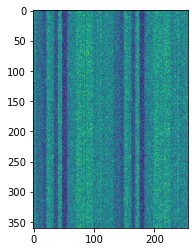

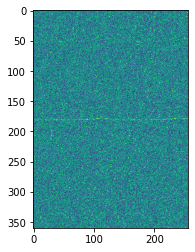

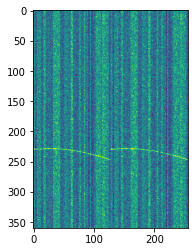

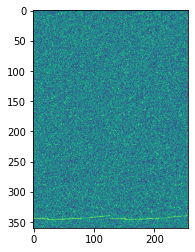

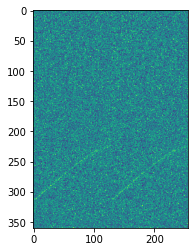

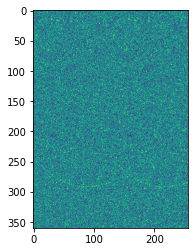

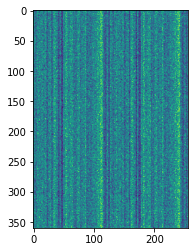

In [10]:
for i in range(10):
    img, y, _= trn_ds[np.random.randint(0, len(trn_ds))]
    customplot(torch.tensor(img), torch.tensor(y))
    plt.pause(0.1)


In [9]:
class CustomLoss(nn.Module):
    def __init__(self, loss_func):
        super().__init__()
        self.loss_func = loss_func

    def forward(self, output, mask, label):
        return self.loss_func(output * (1 - mask), label * (1 - mask))

In [12]:
trn_dl = DataLoader(
    trn_ds,
    batch_size=CFG.bs,
    shuffle=True,
    num_workers=CFG.nw,
    pin_memory=True,
    drop_last=True,
)
vld_dl = DataLoader(
    vld_ds,
    batch_size=CFG.bs,
    shuffle=False,
    num_workers=CFG.nw,
    pin_memory=True,
)
custom_model = SRMNet(in_chn=2)
opt = torch.optim.AdamW(custom_model.parameters(), lr=CFG.lr, weight_decay=CFG.wd)
loss_func = CustomLoss(nn.L1Loss())
warmup_steps = int(len(trn_dl) * int(CFG.warmup_pct * CFG.epoch))
total_steps = int(len(trn_dl) * CFG.epoch)
sched = get_linear_schedule_with_warmup(
    opt, num_warmup_steps=warmup_steps, num_training_steps=total_steps
)

fit_mixup(
    epochs=CFG.epoch,
    model=custom_model,
    train_dl=trn_dl,
    valid_dl=vld_dl,
    loss_fn=loss_func,
    opt=opt,
    folder=CFG.folder,
    exp_name=f"{CFG.exp_name}",
    device="cuda:1",
    sched=sched,
)

epoch,train_loss,valid_loss
0,0.021418,0.019014
1,0.018781,0.018921
2,0.018664,0.018834
3,0.018592,0.018771
4,0.018557,0.018771
5,0.018542,0.018762
6,0.018528,0.018694
7,0.018516,0.018720
8,0.018494,0.018680
9,0.018454,0.018599


Better model found at epoch 0 with value: 0.019013730084002728.
Better model found at epoch 1 with value: 0.018920641188660905.
Better model found at epoch 2 with value: 0.01883420466713863.
Better model found at epoch 3 with value: 0.01877051471180654.
Better model found at epoch 4 with value: 0.018771322720511765.
Better model found at epoch 5 with value: 0.01876206349285713.
Better model found at epoch 6 with value: 0.01869391291917357.
Better model found at epoch 7 with value: 0.018719913934201547.
Better model found at epoch 8 with value: 0.018679926839786327.
Better model found at epoch 9 with value: 0.018599219516499253.
Better model found at epoch 10 with value: 0.018496355142425133.
Better model found at epoch 11 with value: 0.018414040254903355.
Better model found at epoch 12 with value: 0.018244373672692823.
Better model found at epoch 13 with value: 0.018101023166151482.
Better model found at epoch 14 with value: 0.017945913533587148.
Better model found at epoch 15 with val

In [14]:

custom_model =  SRMNet(in_chn=2)
custom_model.load_state_dict(torch.load('NOISE_TO_VOID_TRN/NOISE_TO_VOID_TRN_NOISE_TO_VOID_56.pth'))
custom_model.cuda();
custom_model.eval();

submit = pd.read_csv('../data/sample_submission.csv')
submit.columns = ['fn', 'target']
submit['fn'] = submit['fn'].apply(lambda x: Path('../data/test')/f'{x}.hdf5')
submit.columns = ['id', 'target']


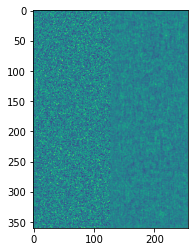

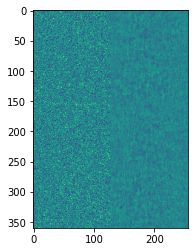

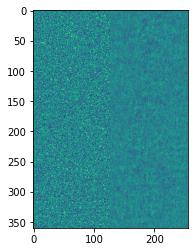

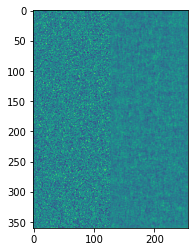

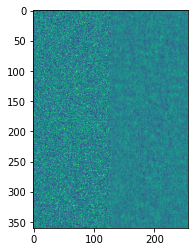

...

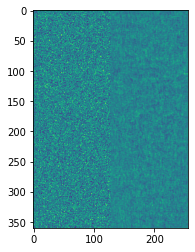

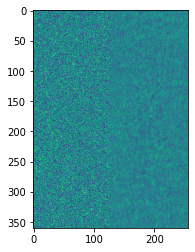

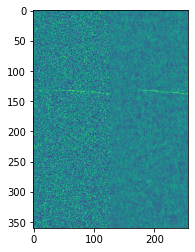

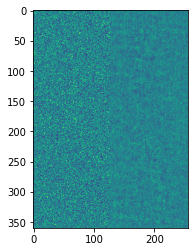

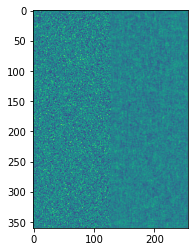

In [15]:
trn_ds = DataV0(submit)
for k in range(100):
    img, _, _ = trn_ds[k]
    img = torch.tensor(img).unsqueeze(0)
    with torch.no_grad():
        #print(tst_ds.df.iloc[k].id.stem, tst_ds.df.iloc[k].target)
        out = custom_model(img.cuda()).detach().cpu()
        customplot(img[0], out[0] )
        plt.pause(0.1)

In [10]:
class CFG:
    bs = 32
    nw = 4
    model_name = "NOISE_TO_VOID_V1"
    lr = 1e-4
    wd = 1e-4
    epoch = 10
    warmup_pct = 0.01
    num_classes = 2
    dropout_rate = 0.3
    folder = "NOISE_TO_VOID_TRN_V1"
    exp_name = f"{folder}_{model_name}"

In [11]:
submit = pd.read_csv('../data/sample_submission.csv')
submit.columns = ['fn', 'target']
submit['fn'] = submit['fn'].apply(lambda x: Path('../data/test')/f'{x}.hdf5')
submit.columns = ['id', 'target']

trn_ds = DataV0(submit)
trn_ds = DataV0(submit[:100])

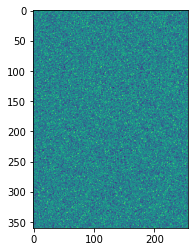

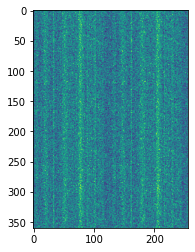

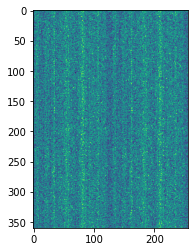

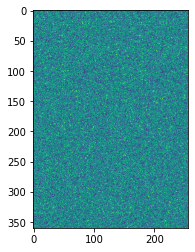

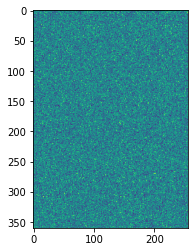

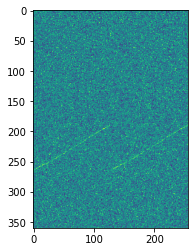

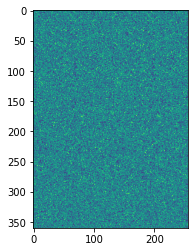

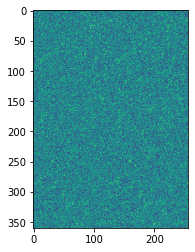

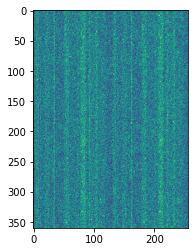

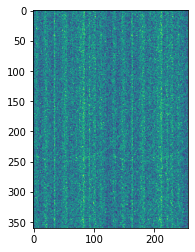

In [12]:
for i in range(10):
    img, y, _= trn_ds[np.random.randint(0, len(trn_ds))]
    customplot(torch.tensor(img), torch.tensor(y))
    plt.pause(0.1)


In [15]:
class CFG:
    bs = 32
    nw = 4
    model_name = "NOISE_TO_VOID_V2"
    lr = 1e-4
    wd = 1e-4
    epoch = 10
    warmup_pct = 0.1
    num_classes = 2
    dropout_rate = 0.3
    folder = "NOISE_TO_VOID_TRN"
    exp_name = f"{folder}_{model_name}"
    
trn_dl = DataLoader(
    trn_ds,
    batch_size=CFG.bs,
    shuffle=True,
    num_workers=CFG.nw,
    pin_memory=True,
    drop_last=True,
)
vld_dl = DataLoader(
    vld_ds,
    batch_size=CFG.bs,
    shuffle=False,
    num_workers=CFG.nw,
    pin_memory=True,
)
custom_model =  SRMNet(in_chn=2)
custom_model.load_state_dict(torch.load('NOISE_TO_VOID_TRN/NOISE_TO_VOID_TRN_NOISE_TO_VOID_98.pth'))
opt = torch.optim.AdamW(custom_model.parameters(), lr=CFG.lr, weight_decay=CFG.wd)
loss_func = CustomLoss(nn.L1Loss())
warmup_steps = int(len(trn_dl) * int(CFG.warmup_pct * CFG.epoch))
total_steps = int(len(trn_dl) * CFG.epoch)
sched = get_linear_schedule_with_warmup(
    opt, num_warmup_steps=warmup_steps, num_training_steps=total_steps
)

fit_mixup(
    epochs=CFG.epoch,
    model=custom_model,
    train_dl=trn_dl,
    valid_dl=vld_dl,
    loss_fn=loss_func,
    opt=opt,
    folder=CFG.folder,
    exp_name=f"{CFG.exp_name}",
    device="cuda:1",
    sched=sched,
)

epoch,train_loss,valid_loss
0,0.019188,0.019307
1,0.019118,0.019291
2,0.019112,0.019292
3,0.019112,0.019298
4,0.019111,0.019327
5,0.019108,0.019290
6,0.019107,0.019290
7,0.019107,0.019293
8,0.019103,0.019334
9,0.019105,0.019287


Better model found at epoch 0 with value: 0.019307439748131254.
Better model found at epoch 1 with value: 0.01929065352059367.
Better model found at epoch 2 with value: 0.019292097307729045.
Better model found at epoch 3 with value: 0.019297931718432148.
Better model found at epoch 4 with value: 0.019326821739988537.
Better model found at epoch 5 with value: 0.01929041089985046.
Better model found at epoch 6 with value: 0.019289555134509043.
Better model found at epoch 7 with value: 0.019292593741809506.
Better model found at epoch 8 with value: 0.019333958510265346.
Better model found at epoch 9 with value: 0.0192866478241403.
Training done


In [17]:
custom_model =  SRMNet(in_chn=2)
custom_model.load_state_dict(torch.load('NOISE_TO_VOID_TRN/NOISE_TO_VOID_TRN_NOISE_TO_VOID_V2_9.pth'))
custom_model.cuda();
custom_model.eval();


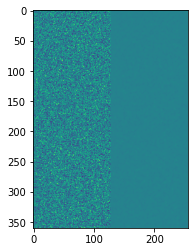

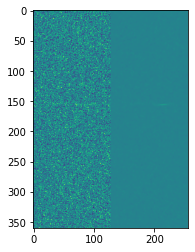

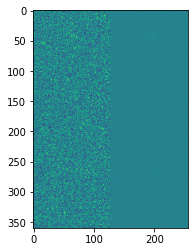

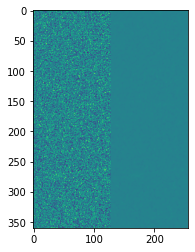

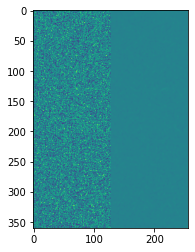

...

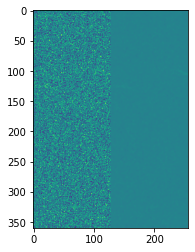

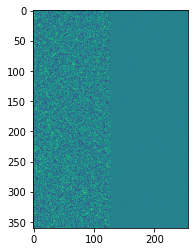

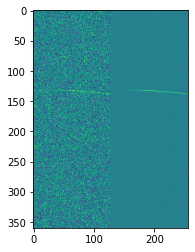

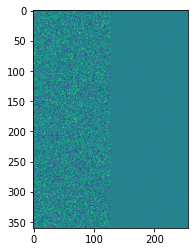

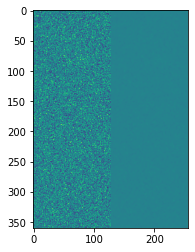

In [18]:
trn_ds = DataV0(submit)
for k in range(100):
    img, _, _ = trn_ds[k]
    img = torch.tensor(img).unsqueeze(0)
    with torch.no_grad():
        #print(tst_ds.df.iloc[k].id.stem, tst_ds.df.iloc[k].target)
        out = custom_model(img.cuda()).detach().cpu()
        customplot(img[0], out[0] )
        plt.pause(0.1)